In [ ]:
 !pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.9/69.9 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.5 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler 0

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="2NBbupbg2nhidokX1UR0")
project = rf.workspace("study-jzyvf").project("metro-detection")
dataset = project.version(6).download("coco-segmentation")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Metro-Detection-6 in coco-segmentation:: 100%|██████████| 1129/1129 [00:00<00:00, 2389.85it/s]


In [ ]:
!pip install pycocotools

In [ ]:
!nvidia-smi

Mon Jan 22 07:08:33 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
IMAGE_HEIGHT, IMAGE_WIDTH = 1280, 768

In [ ]:
def extend_image(img, channels=None):
    height, width = img.shape[0], img.shape[1]
    delta = IMAGE_WIDTH - width
    if channels:
        padding = np.zeros((height, int(delta / 2), channels), np.uint8)
    else:
        padding = np.zeros((height, int(delta / 2)), np.uint8)
    img = np.concatenate((padding, img, padding), axis=1)
    return img

In [ ]:
import json
from pycocotools.coco import COCO
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Загрузите аннотации COCO JSON
coco_annotations_path = "/content/Metro-Detection-6/train/_annotations.coco.json"
coco = COCO(coco_annotations_path)

# Получите идентификаторы изображений с сегментацией
image_ids = coco.getImgIds(imgIds=coco.getImgIds())

# Задайте путь к папке с изображениями
images_folder_path = "/content/Metro-Detection-6/train"

images = []
masks = []

# Загрузите изображения и маски сегментации
for img_id in image_ids:
    img_info = coco.loadImgs(ids=img_id)[0]
    image_path = f"{images_folder_path}/{img_info['file_name']}"
    image = plt.imread(image_path)

    ann_ids = coco.getAnnIds(imgIds=img_info['id'])
    annotations = coco.loadAnns(ann_ids)

    # Создайте пустую маску
    mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)

    # Добавьте маски объектов на изображение
    for ann in annotations:
        coco_mask = coco.annToMask(ann)
        mask = np.maximum(mask, coco_mask * ann['category_id'])

    image = extend_image(image, 3)
    mask = extend_image(mask)

    images.append(image)
    masks.append(mask)

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!


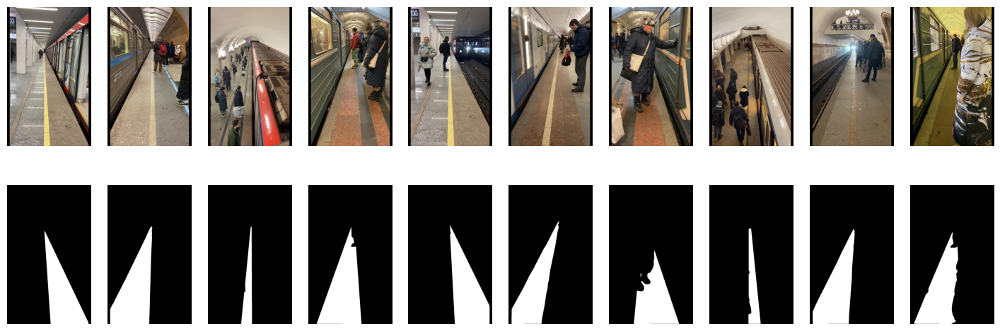

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 6))
for i in range(10):
    plt.subplot(2, 10, i+1)
    plt.axis("off")
    plt.imshow(images[i])

    plt.subplot(2, 10, i+11)
    plt.axis("off")
    plt.imshow(masks[i], cmap='gray')

plt.show()

In [ ]:
DATA_SIZE = 1125

In [ ]:
# ix = np.random.choice(len(images), DATA_SIZE, False)
# np.savetxt("train_idx.csv", ix, delimiter=",")
ix = np.genfromtxt('train_idx.csv', delimiter=',').astype(int)
tr, val = np.split(ix, [int(0.9 * DATA_SIZE)])

In [ ]:
print(len(tr), len(val))

1012 113


In [ ]:
images = np.array(images)
masks = np.array(masks)

In [ ]:
from torch.utils.data import DataLoader
batch_size = 3
data_tr = DataLoader(list(zip(np.rollaxis(images[tr], 3, 1), masks[tr, np.newaxis])),
                     batch_size=batch_size, shuffle=True)
data_val = DataLoader(list(zip(np.rollaxis(images[val], 3, 1), masks[val, np.newaxis])),
                      batch_size=batch_size, shuffle=False)

In [ ]:
import gc
del images
del masks
gc.collect()

0

In [ ]:
import torch
import torch.nn  as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [ ]:
import gc

class SegNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        # Each enc_conv/dec_conv block should look like this:
        # nn.Sequential(
        #     nn.Conv2d(...),
        #     ... (2 or 3 conv layers with relu and batchnorm),
        # )
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        self.pool0 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)  # 256 -> 128
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.pool1 =  nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        self.pool2 =  nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        self.bottleneck_pool = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        self.boottleneck_upsample = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec_bottleneck = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )

        # decoder (upsampling)
        self.upsample0 =  nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        self.upsample1 = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.upsample2 = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        self.upsample3 = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 1, kernel_size=3, padding=1),
        )

    def forward(self, x):
        # encoder
        x = x.float()
        e0 = self.enc_conv0(x)
        x, indices0 = self.pool0(e0)
        e1 = self.enc_conv1(x)
        x, indices1 = self.pool1(e1)
        e2 = self.enc_conv2(x)
        x, indices2 = self.pool2(e2)
        e3 = self.enc_conv3(x)
        x, indices3 = self.pool3(e3)

        gc.collect()

        # bottleneck
        b = self.bottleneck_conv(x)
        x, bottleneck_indices = self.bottleneck_pool(b)
        x = self.boottleneck_upsample(x, bottleneck_indices)
        dec_b = self.dec_bottleneck(x)

        gc.collect()

        # decoder
        x = self.upsample0(dec_b, indices3)
        d0 = self.dec_conv0(x)
        x = self.upsample1(d0, indices2)
        d1 = self.dec_conv1(x)
        x = self.upsample2(d1, indices1)
        d2 = self.dec_conv2(x)
        x = self.upsample3(d2, indices0)
        d3 = self.dec_conv3(x)

        return d3

In [ ]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor, limit=0.5):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    outputs = torch.sigmoid(outputs.squeeze(1)) > limit  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0

    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0

    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresholds

    return thresholded

In [ ]:
def bce(y_pred, y_real):
    return y_pred - y_real * y_pred + torch.log(1 + torch.exp(-y_pred))

def bce_loss(y_pred, y_real):
    return torch.mean(bce(y_pred, y_real))

In [ ]:
def score_model(model, metric, data, threshold=0.5):
    model.eval()  # testing mode
    scores = 0
    total_size = 0
    with torch.set_grad_enabled(False):
        for X_batch, Y_label in data:
            total_size += len(X_batch)
            Y_pred = model(X_batch.to(device))
            scores += metric(Y_pred, Y_label.to(device), limit=threshold).mean().item() * len(X_batch)

    return scores/total_size

In [ ]:
import seaborn as sns

def analyze_history(loss_history, score_history):
    sns.set(style='whitegrid', font_scale=1.5)

    fig, (ax1, ax2) = plt.subplots(1, 2)
    plt.figure(figsize=(12, 6))


    train_loss = loss_history[:, 0]
    val_loss = loss_history[:, 1]
    ax1.plot(train_loss, marker='o', label='train')
    ax1.plot(val_loss, marker='o', label='val')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()

    # train_score = score_history[:, 0]
    # val_score = score_history[:, 1]
    val_score = score_history
    # ax2.plot(train_score, marker='o', label='train')
    ax2.plot(val_score, marker='o', label='val')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Score')
    ax2.legend()

    plt.show()

In [ ]:
import gc

def fit_epoch(model, train_loader, criterion, optimizer):
    model.train()
    running_loss = 0.0
    processed_data = 0

    tic = time()
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
        processed_data += inputs.size(0)

        del inputs
        del outputs
        del labels
        torch.cuda.empty_cache()
        gc.collect()

    toc = time()

    print("Fit epoch time: ", toc - tic)
    train_loss = running_loss / processed_data
    return train_loss

In [ ]:
from IPython.display import clear_output
import gc

def eval_epoch(model, val_loader, criterion):
    model.eval()
    running_loss = 0.0
    processed_size = 0
    X_val, Y_val  = next(iter(val_loader))

    tic = time()
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        with torch.set_grad_enabled(False):
            outputs = model(inputs)
            loss = criterion(outputs, labels)

        running_loss += loss.item() * inputs.size(0)
        processed_size += inputs.size(0)

        del inputs
        del outputs
        del labels
        torch.cuda.empty_cache()
        gc.collect()

    toc = time()

    print("Eval epoch time: ", toc - tic)

    Y_hat = model(X_val.to(device))
    Y_hat = Y_hat.to('cpu').detach()

    plt.figure(figsize=(8, 10))
    # Visualize tools
    for k in range(3):
        plt.subplot(3, 3, k+1)
        plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3))
        plt.title('Real image')
        plt.axis('off')

        plt.subplot(3, 3, k+4)
        plt.imshow(torch.sigmoid(Y_hat[k, 0]) > 0.5, cmap='gray')
        plt.title('Output')
        plt.axis('off')

        plt.subplot(3, 3, k+7)
        plt.imshow(torch.sigmoid(Y_val[k, 0]) > 0.5, cmap='gray')
        plt.title('Real mask')
        plt.axis('off')

    plt.show()

    del Y_hat
    torch.cuda.empty_cache()

    val_loss = running_loss / processed_size
    return val_loss

In [ ]:
total = 0

def train(model, opt, loss_fn, epochs, data_tr, data_val, scheduler=None):
    torch.autograd.set_detect_anomaly(True)
    loss_history = []
    score_history = []

    for epoch in range(epochs):
        torch.cuda.empty_cache()
        gc.collect()

        print('* Epoch %d/%d' % (epoch+1, epochs))

        train_loss = fit_epoch(model, data_tr, loss_fn, opt)
        val_loss = eval_epoch(model, data_val, loss_fn)
        if scheduler:
            scheduler.step(val_loss)

        loss_history.append((train_loss, val_loss))

        # train_score = score_model(model, iou_pytorch, data_tr)
        tic = time()
        val_score = score_model(model, iou_pytorch, data_val)
        toc = time()
        print("Score on eval time: ", toc - tic)
        score_history.append(val_score)

        global total
        total += 1
        torch.save(model.state_dict(), f"segnet_bce_1125_{total}_epoch.pth")

        print(f'\n\tTrain loss: {train_loss};'
              f'\n\tVal loss: {val_loss};'
              f' \n\tVal score: {val_score};')

    return loss_history, score_history

In [ ]:
segnet_model_bce = SegNet().to(device)

* Epoch 1/10
Fit epoch time:  942.5725393295288
Eval epoch time:  37.615676403045654


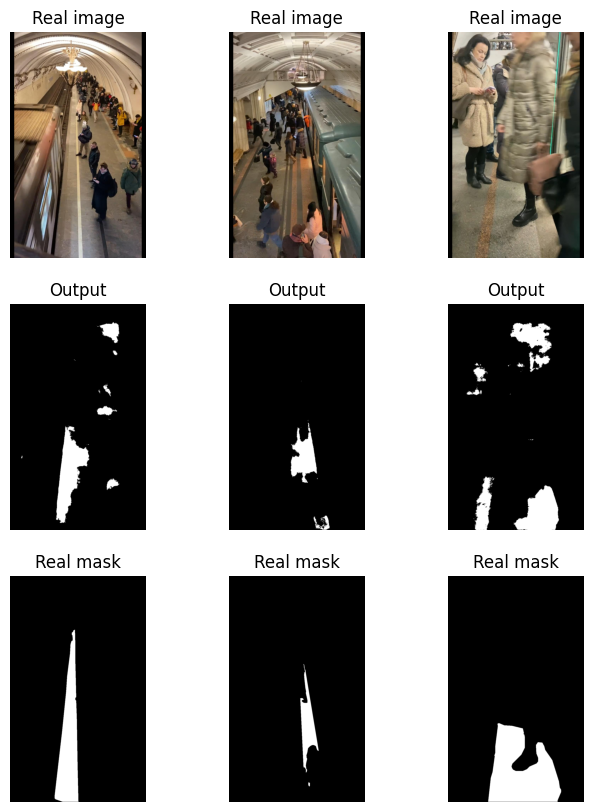

Score on eval time:  30.807445287704468

	Train loss: 0.2369415695473493;
	Val loss: 0.19334550313981233; 
	Val score: 0.3371681574303492;
* Epoch 2/10
Fit epoch time:  945.315859079361
Eval epoch time:  37.323219776153564


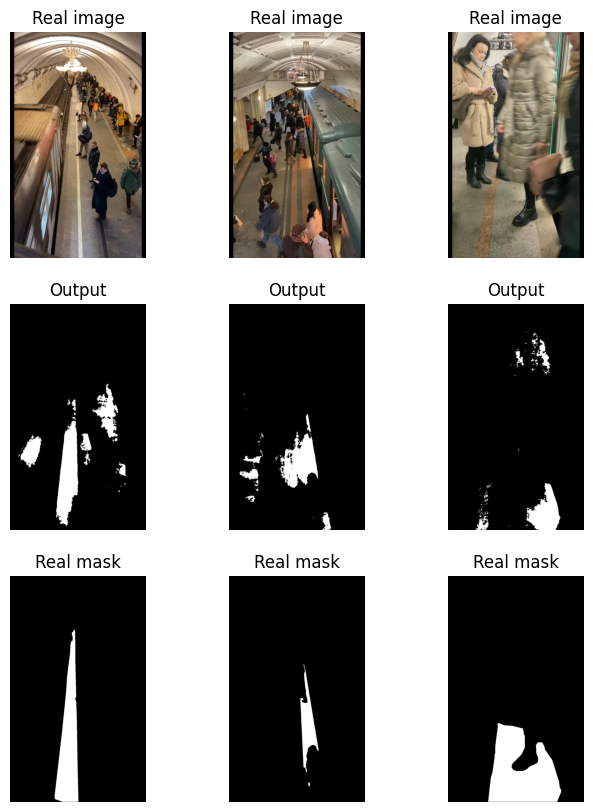

Score on eval time:  30.71905207633972

	Train loss: 0.12656019495159623;
	Val loss: 0.1343911361377851; 
	Val score: 0.36017700838567934;
* Epoch 3/10
Fit epoch time:  944.7707307338715
Eval epoch time:  37.45596098899841


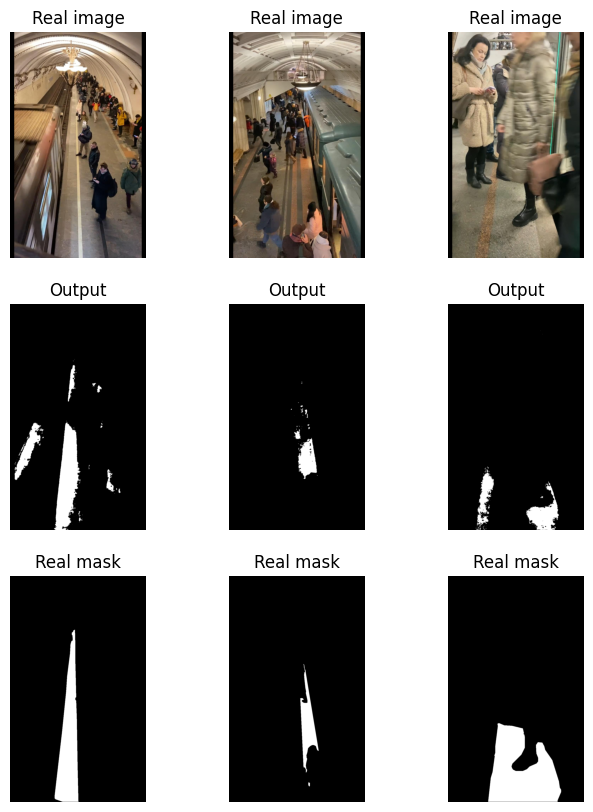

Score on eval time:  30.750194311141968

	Train loss: 0.09381908264651659;
	Val loss: 0.09189224149207625; 
	Val score: 0.544247812797538;
* Epoch 4/10
Fit epoch time:  944.6924231052399
Eval epoch time:  37.385064125061035


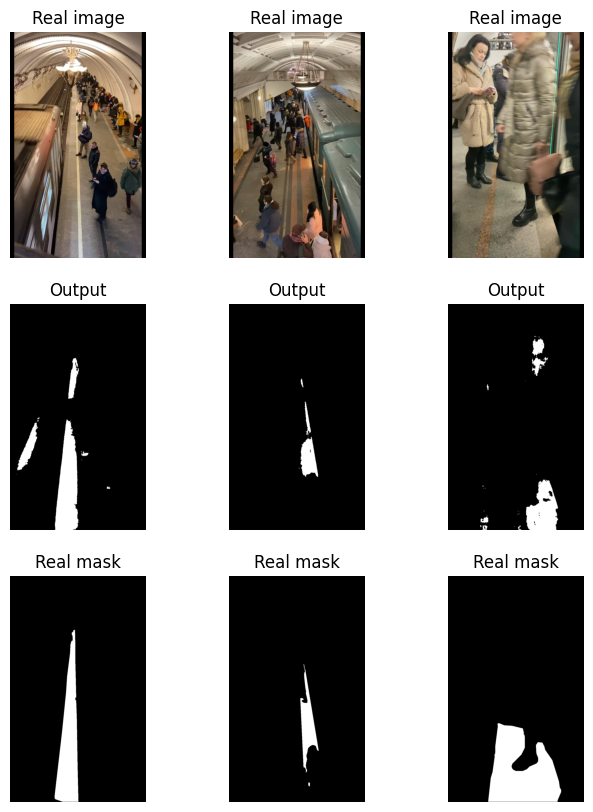

Score on eval time:  30.712904930114746

	Train loss: 0.07243835087129367;
	Val loss: 0.06719750711546008; 
	Val score: 0.665486752986908;
* Epoch 5/10
Fit epoch time:  945.2054390907288
Eval epoch time:  38.29775023460388


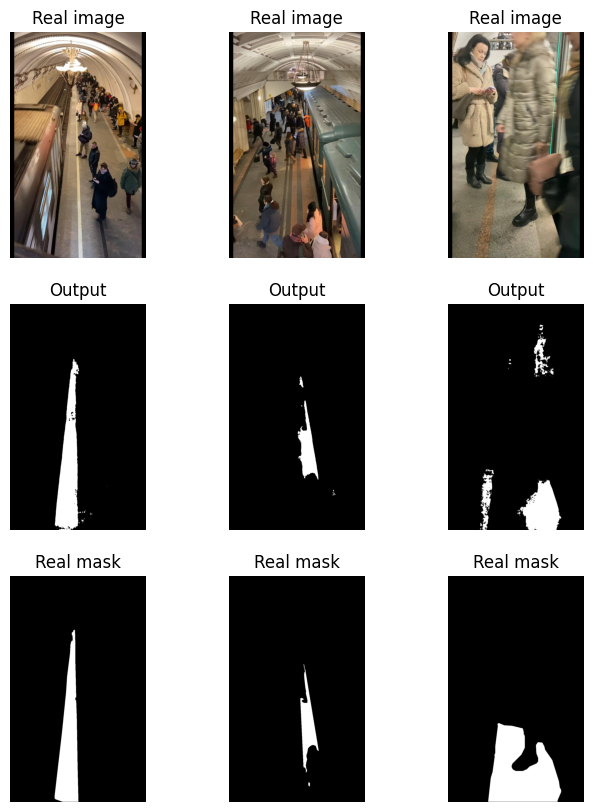

Score on eval time:  30.784557104110718

	Train loss: 0.056217139198448465;
	Val loss: 0.05618231516100664; 
	Val score: 0.7362832189661211;
* Epoch 6/10
Fit epoch time:  950.6958949565887
Eval epoch time:  37.9928765296936


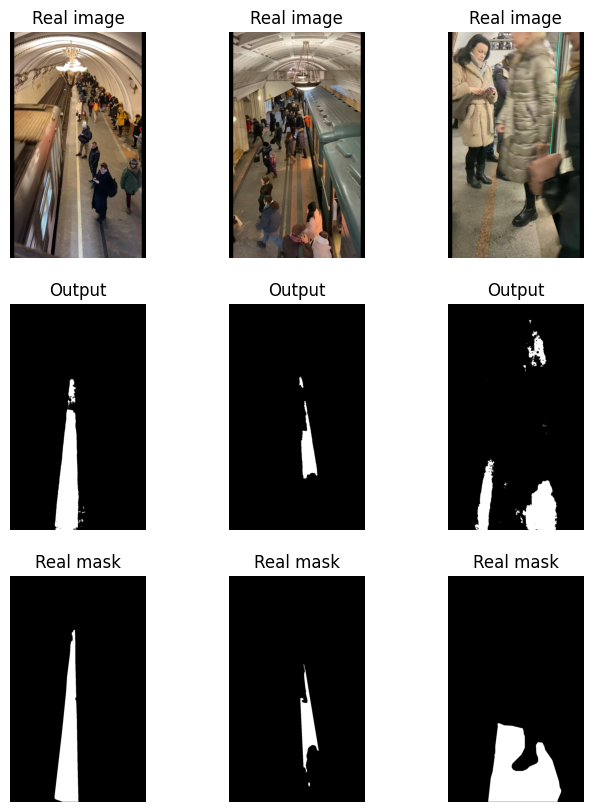

Score on eval time:  30.757807970046997

	Train loss: 0.05432440389937946;
	Val loss: 0.054182519608762414; 
	Val score: 0.7707964936188892;
* Epoch 7/10
Fit epoch time:  949.4028086662292
Eval epoch time:  38.036603689193726


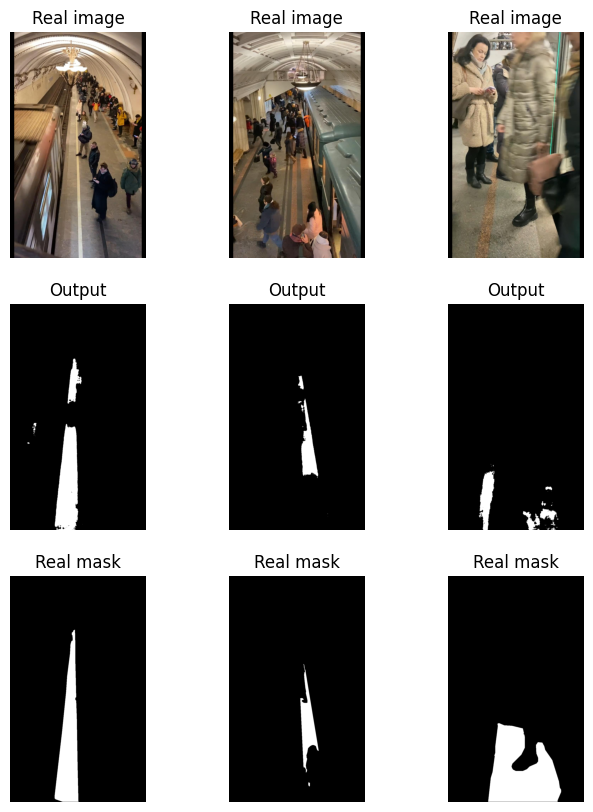

Score on eval time:  30.666017055511475

	Train loss: 0.04671496378714329;
	Val loss: 0.04267244556902257; 
	Val score: 0.8115044615964974;
* Epoch 8/10
Fit epoch time:  948.5478157997131
Eval epoch time:  38.01890850067139


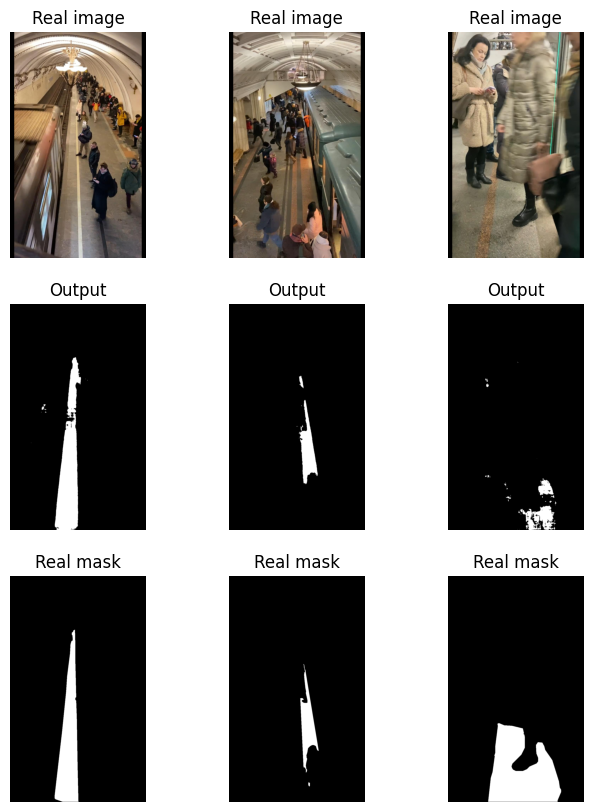

Score on eval time:  30.77747631072998

	Train loss: 0.037890045698400834;
	Val loss: 0.04429555854933188; 
	Val score: 0.7938053542006333;
* Epoch 9/10
Fit epoch time:  949.7061939239502
Eval epoch time:  38.04164910316467


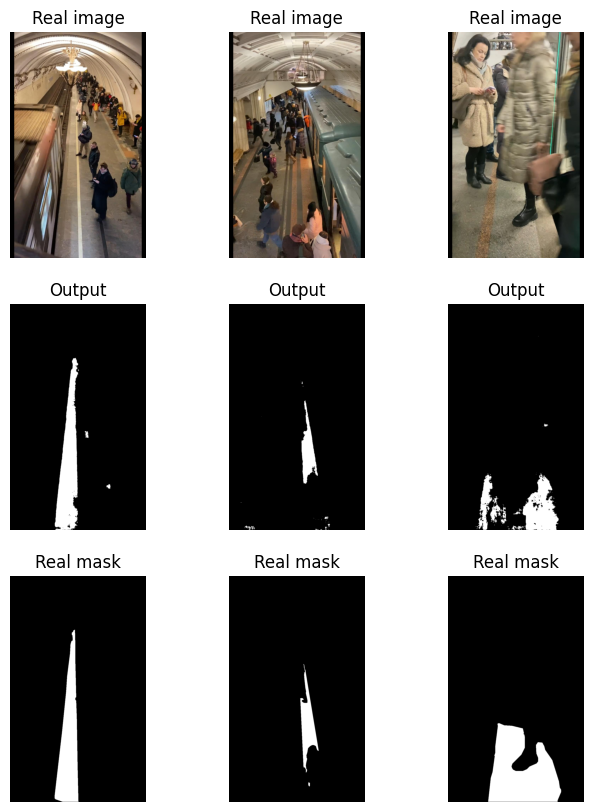

Score on eval time:  30.70268750190735

	Train loss: 0.03277291532600365;
	Val loss: 0.04567529599849893; 
	Val score: 0.8097345465052445;
* Epoch 10/10
Fit epoch time:  949.2028501033783
Eval epoch time:  38.01791453361511


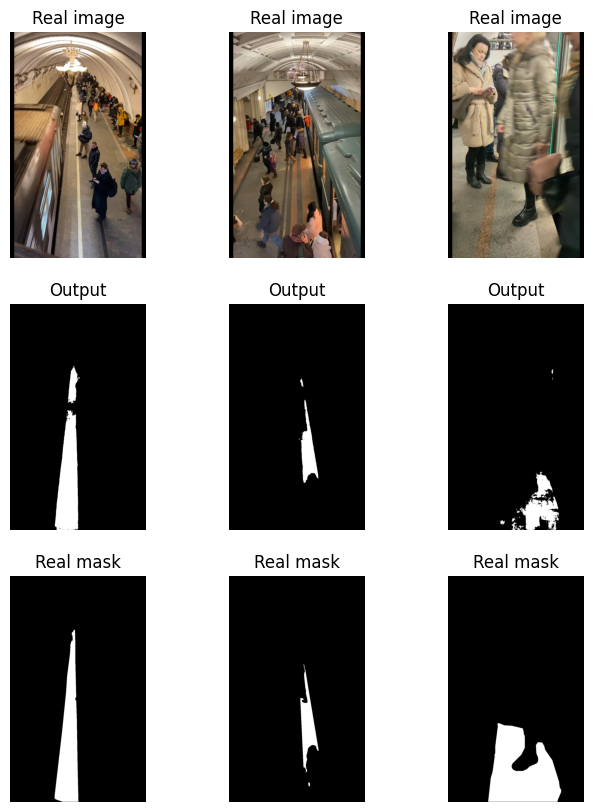

Score on eval time:  30.749741077423096

	Train loss: 0.030522394804799333;
	Val loss: 0.03347587704131034; 
	Val score: 0.8504425076256811;


In [ ]:
max_epochs = 10
optimizer = optim.AdamW(segnet_model_bce.parameters(), lr=0.0001)
loss_hist_1, score_hist_1 = train(segnet_model_bce, optimizer, bce_loss, max_epochs, data_tr, data_val)

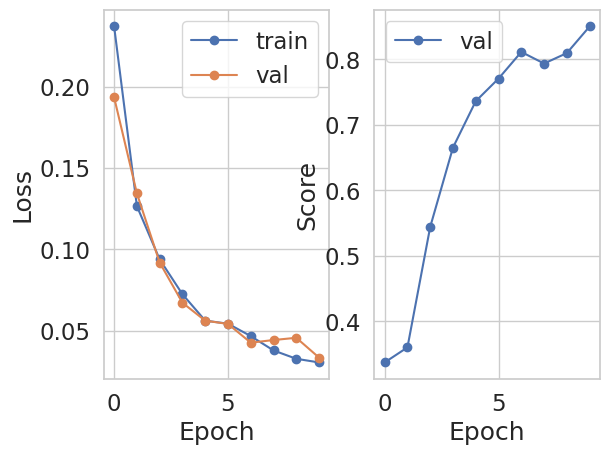

<Figure size 1200x600 with 0 Axes>

In [ ]:
analyze_history(np.array(loss_hist_1), np.array(score_hist_1))

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
segnet_model_bce = SegNet().to(device)
segnet_model_bce.load_state_dict(torch.load('/content/drive/MyDrive/segnet_bce_1125_10_epoch.pth'))

<All keys matched successfully>

In [ ]:
print(score_model(segnet_model_bce, iou_pytorch, data_val))

0.8504425076256811


In [ ]:
optimizer = optim.AdamW(segnet_model_bce.parameters(), lr=0.0001)

* Epoch 1/10
Fit epoch time:  973.3849205970764
Eval epoch time:  39.68194913864136


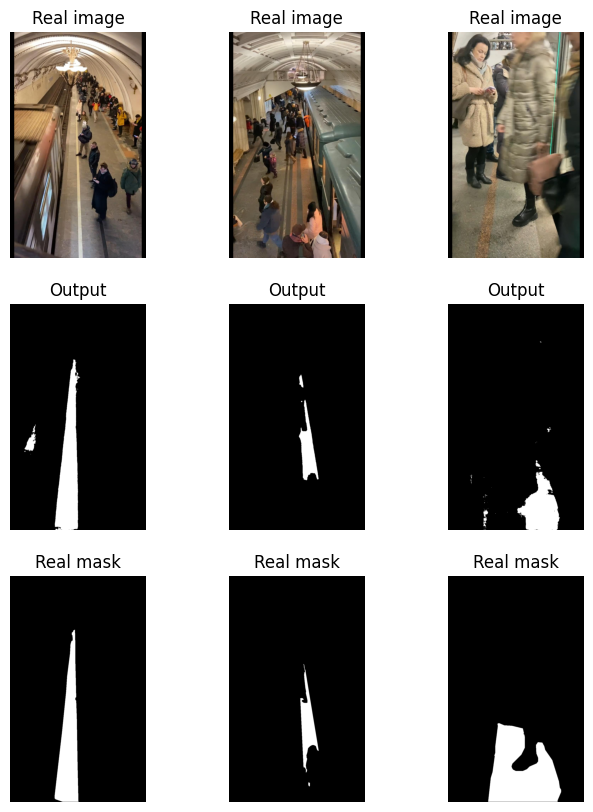

Score on eval time:  31.988579988479614

	Train loss: 0.0323756719587864;
	Val loss: 0.0408798691577616; 
	Val score: 0.8185840998075705;
* Epoch 2/10
Fit epoch time:  983.7845480442047
Eval epoch time:  39.645469188690186


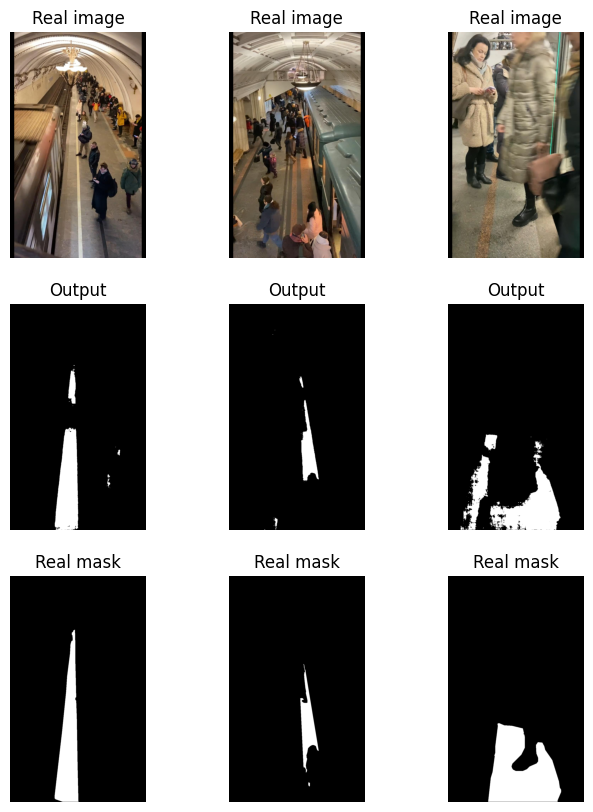

Score on eval time:  32.016212940216064

	Train loss: 0.026432929737235718;
	Val loss: 0.03504705212318; 
	Val score: 0.83716817186997;
* Epoch 3/10
Fit epoch time:  982.5508806705475
Eval epoch time:  39.45406174659729


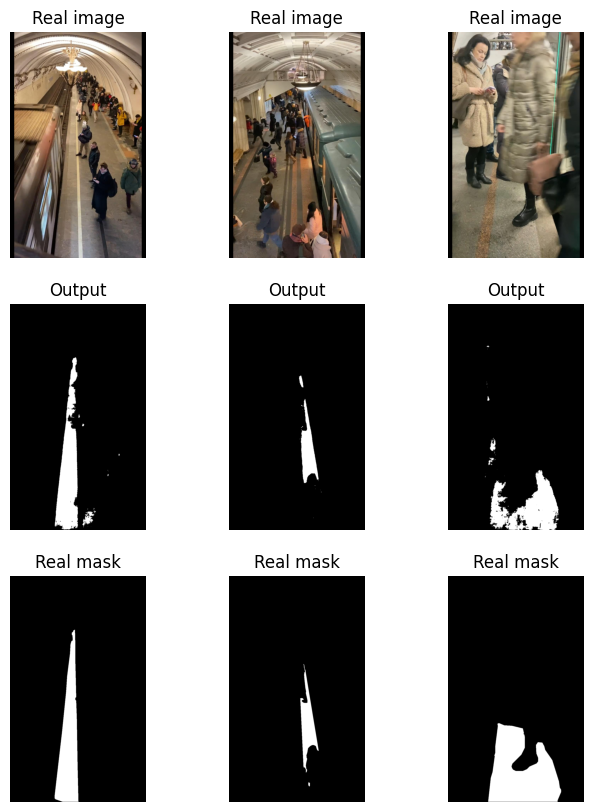

Score on eval time:  32.00535273551941

	Train loss: 0.025387124710609554;
	Val loss: 0.03332156751436734; 
	Val score: 0.8610619797115833;
* Epoch 4/10
Fit epoch time:  978.5021920204163
Eval epoch time:  39.598795890808105


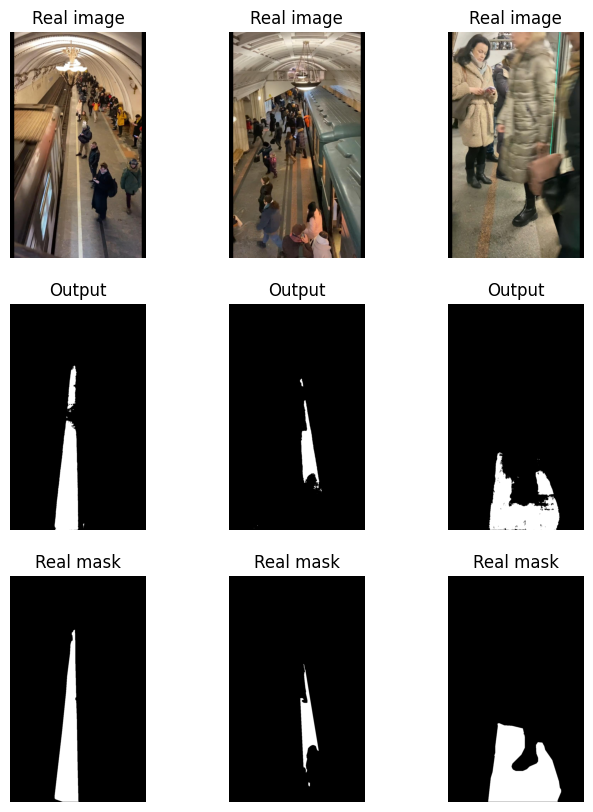

Score on eval time:  32.06013536453247

	Train loss: 0.022738390527628802;
	Val loss: 0.026913546355424728; 
	Val score: 0.8787610968657299;
* Epoch 5/10
Fit epoch time:  983.4742059707642
Eval epoch time:  39.45820212364197


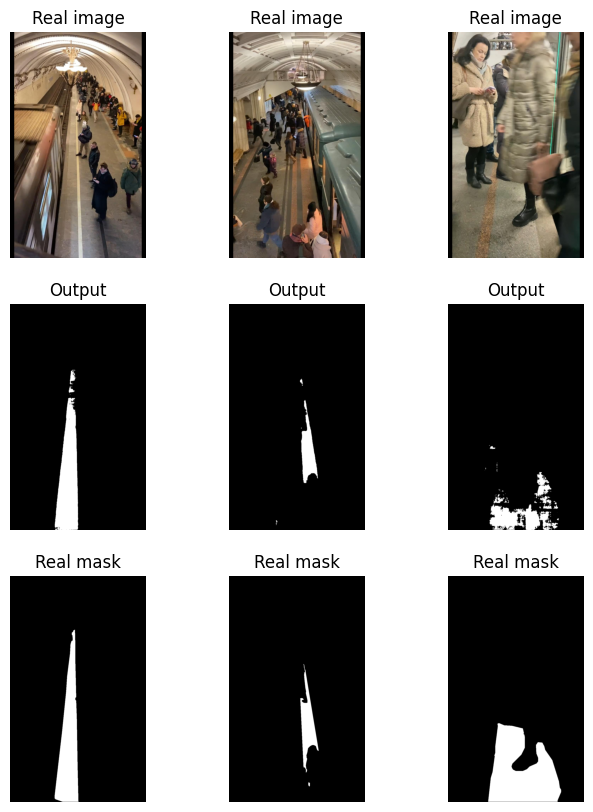

Score on eval time:  32.180919885635376

	Train loss: 0.023198155062309957;
	Val loss: 0.03652777995057074; 
	Val score: 0.8548672879691672;
* Epoch 6/10
Fit epoch time:  980.0562541484833
Eval epoch time:  39.28658676147461


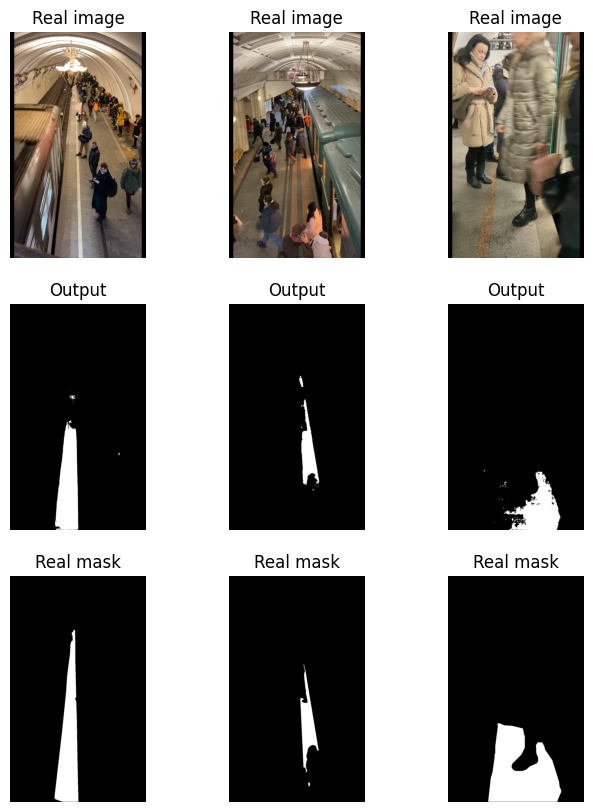

Score on eval time:  32.024202823638916

	Train loss: 0.018988014577534566;
	Val loss: 0.026479776124511144; 
	Val score: 0.8725663951012941;
* Epoch 7/10
Fit epoch time:  979.5876822471619
Eval epoch time:  39.315455198287964


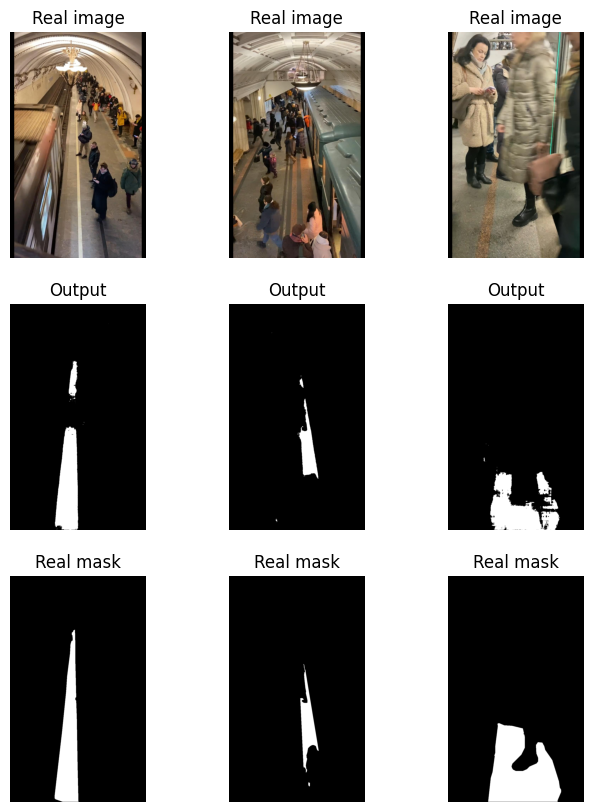

Score on eval time:  31.998276948928833

	Train loss: 0.024505712629365826;
	Val loss: 0.030073677016570505; 
	Val score: 0.8522124179696615;
* Epoch 8/10
Fit epoch time:  980.9697027206421
Eval epoch time:  39.289748430252075


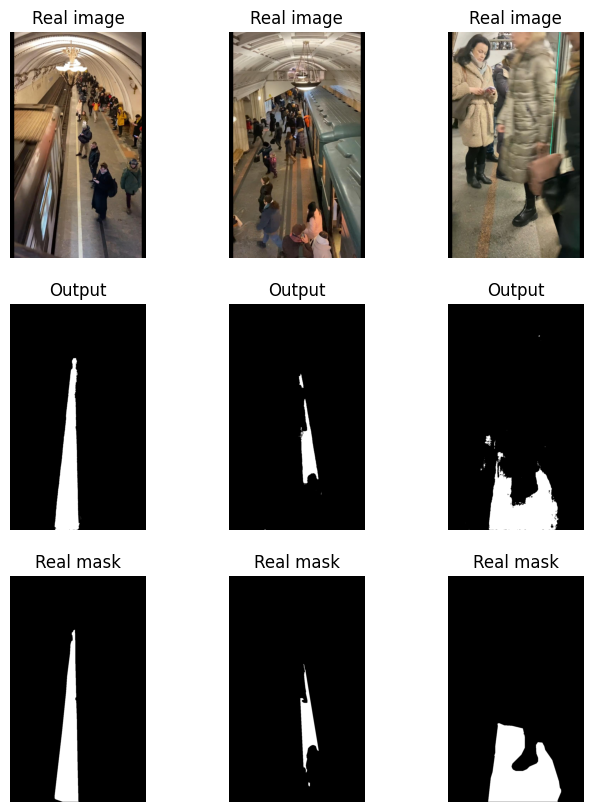

Score on eval time:  32.04272794723511

	Train loss: 0.01617700869830421;
	Val loss: 0.022264794809166835; 
	Val score: 0.9035398422089298;
* Epoch 9/10
Fit epoch time:  981.9722301959991
Eval epoch time:  39.36114239692688


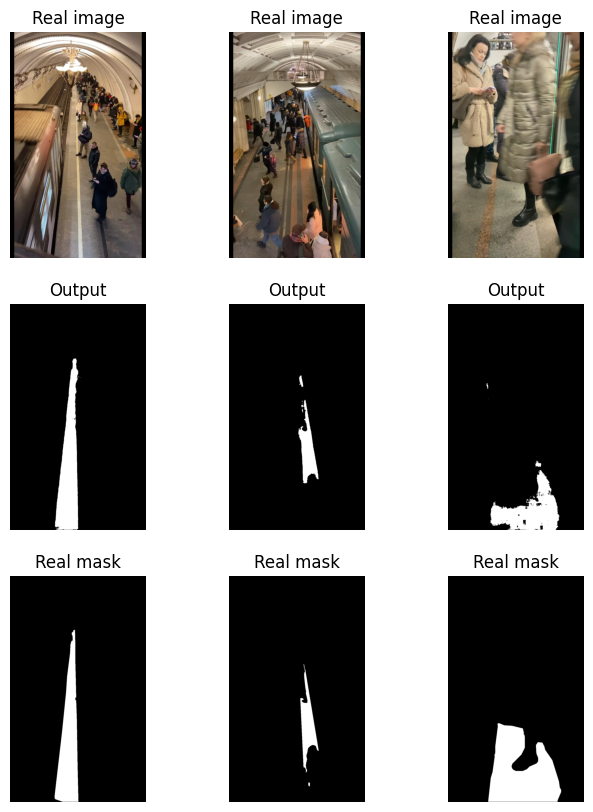

Score on eval time:  32.09429574012756

	Train loss: 0.014391614014665658;
	Val loss: 0.029856530731065874; 
	Val score: 0.8876106396185613;
* Epoch 10/10
Fit epoch time:  979.1881282329559
Eval epoch time:  39.395586252212524


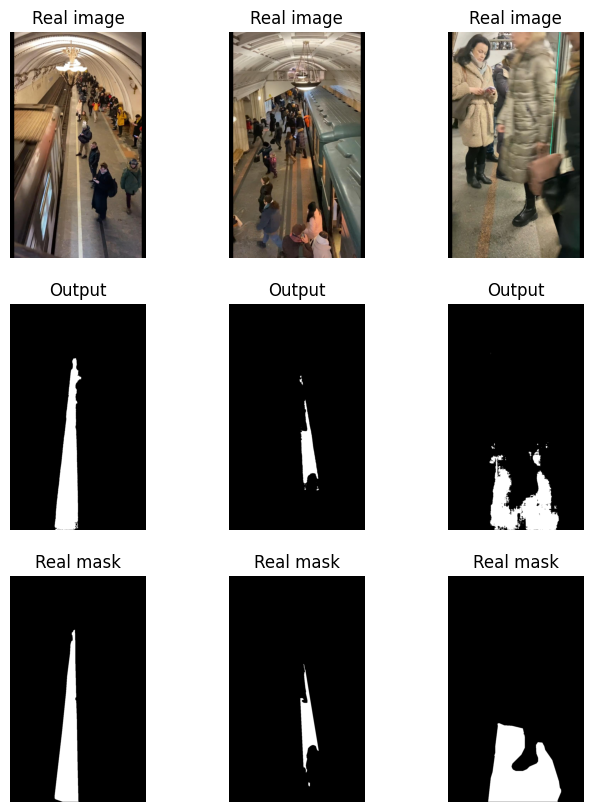

Score on eval time:  31.955747604370117

	Train loss: 0.014482805491130608;
	Val loss: 0.017298354033743385; 
	Val score: 0.9106194878046492;


In [ ]:
loss_hist_2, score_hist_2 = train(segnet_model_bce, optimizer, bce_loss, 10, data_tr, data_val)

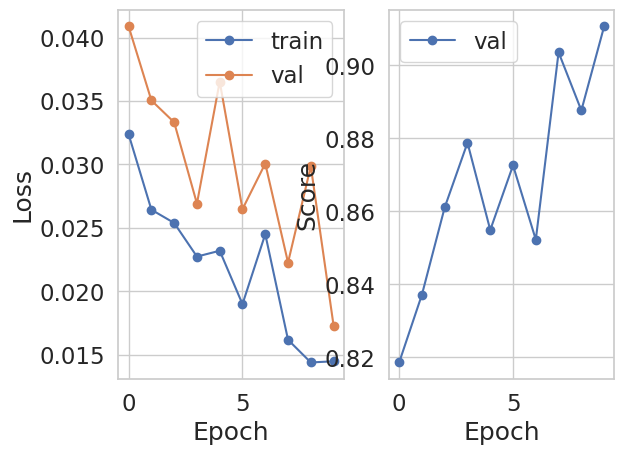

<Figure size 1200x600 with 0 Axes>

In [ ]:
analyze_history(np.array(loss_hist_2), np.array(score_hist_2))

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
segnet_model_bce = SegNet().to(device)
segnet_model_bce.load_state_dict(torch.load('/content/drive/MyDrive/segnet_bce_1125_20_epoch.pth'))

<All keys matched successfully>

In [ ]:
print(score_model(segnet_model_bce, iou_pytorch, data_val))

0.9106194878046492


In [ ]:
optimizer = optim.AdamW(segnet_model_bce.parameters(), lr=0.0001)

* Epoch 1/10
Fit epoch time:  936.9821970462799
Eval epoch time:  38.096582889556885


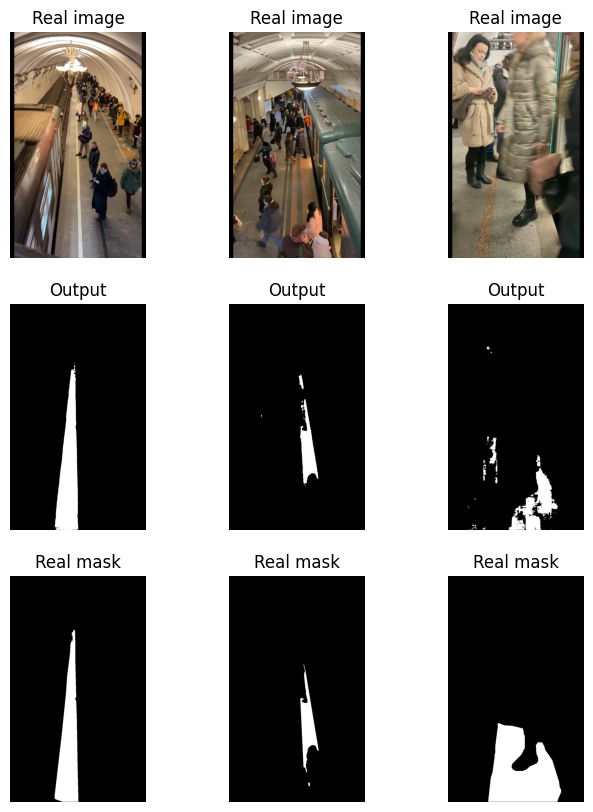

Score on eval time:  30.80717182159424

	Train loss: 0.017279203239416063;
	Val loss: 0.03273435666398928; 
	Val score: 0.8964602013604831;
* Epoch 2/10
Fit epoch time:  937.1882660388947
Eval epoch time:  37.97278165817261


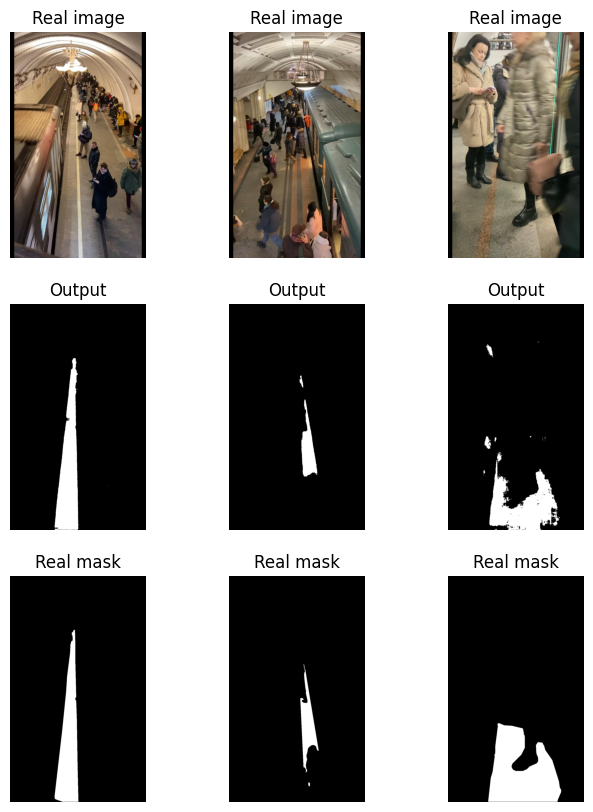

Score on eval time:  30.77737045288086

	Train loss: 0.01566744859656135;
	Val loss: 0.024779585861823463; 
	Val score: 0.8867256862927327;
* Epoch 3/10
Fit epoch time:  935.8320534229279
Eval epoch time:  37.91867113113403


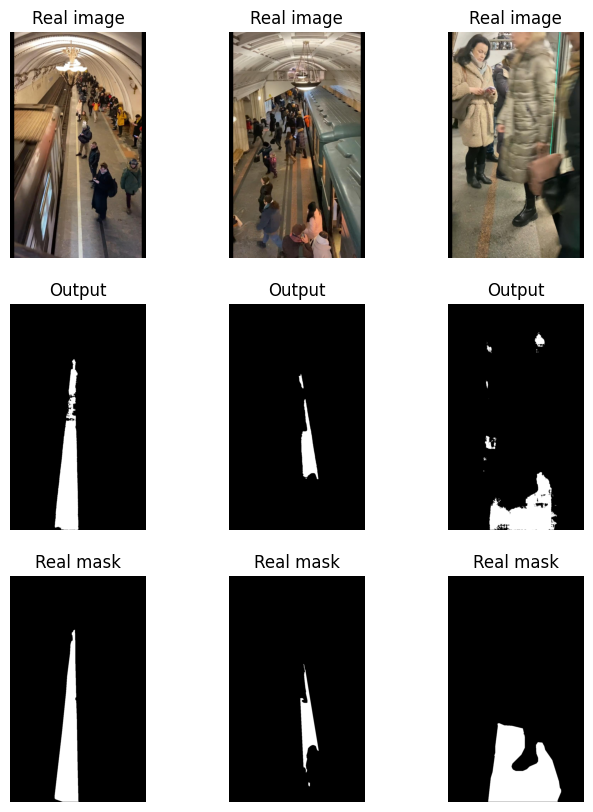

Score on eval time:  30.87545609474182

	Train loss: 0.01255096466369787;
	Val loss: 0.03226986938296298; 
	Val score: 0.8991150660852415;
* Epoch 4/10
Fit epoch time:  936.766743183136
Eval epoch time:  38.05704379081726


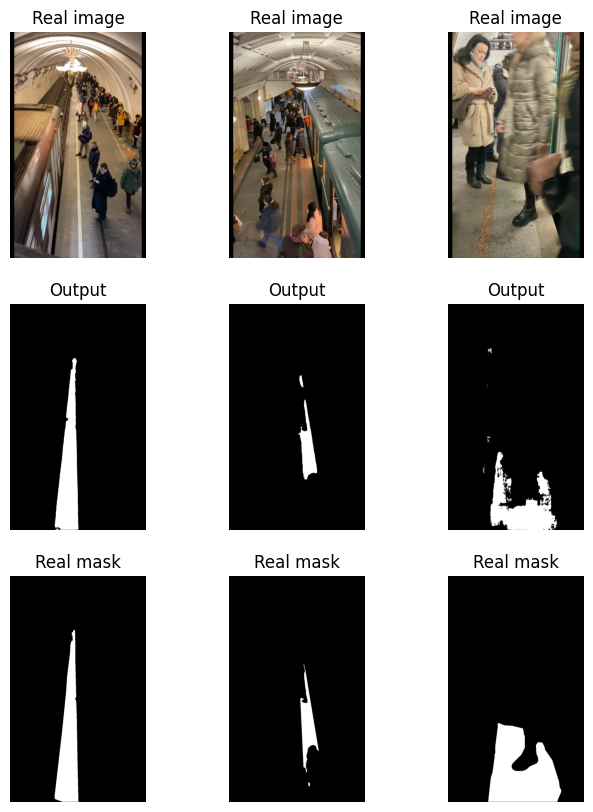

Score on eval time:  30.762332439422607

	Train loss: 0.015696677739829516;
	Val loss: 0.02285589978708762; 
	Val score: 0.9000000225759186;
* Epoch 5/10
Fit epoch time:  935.5264325141907
Eval epoch time:  37.64210820198059


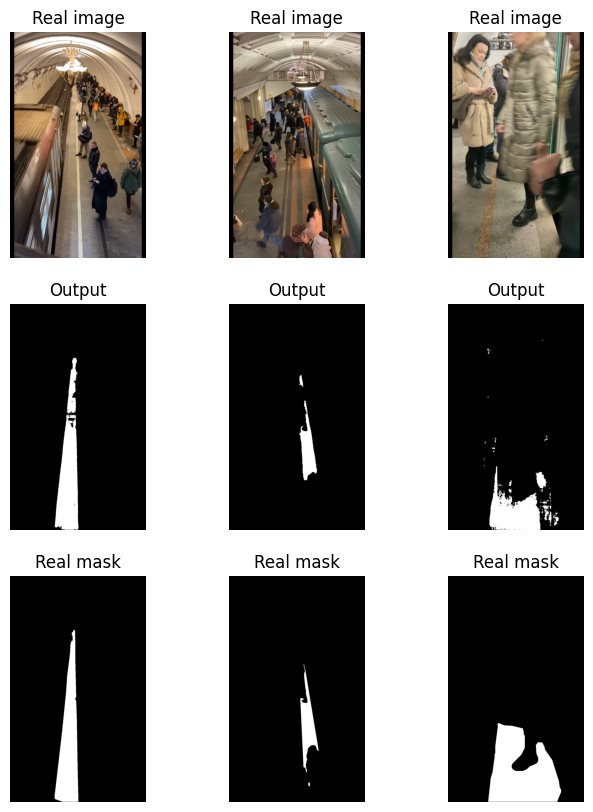

Score on eval time:  30.848348140716553

	Train loss: 0.015579272548184019;
	Val loss: 0.02103841189393955; 
	Val score: 0.9070796729189105;
* Epoch 6/10
Fit epoch time:  936.0083150863647
Eval epoch time:  37.93890690803528


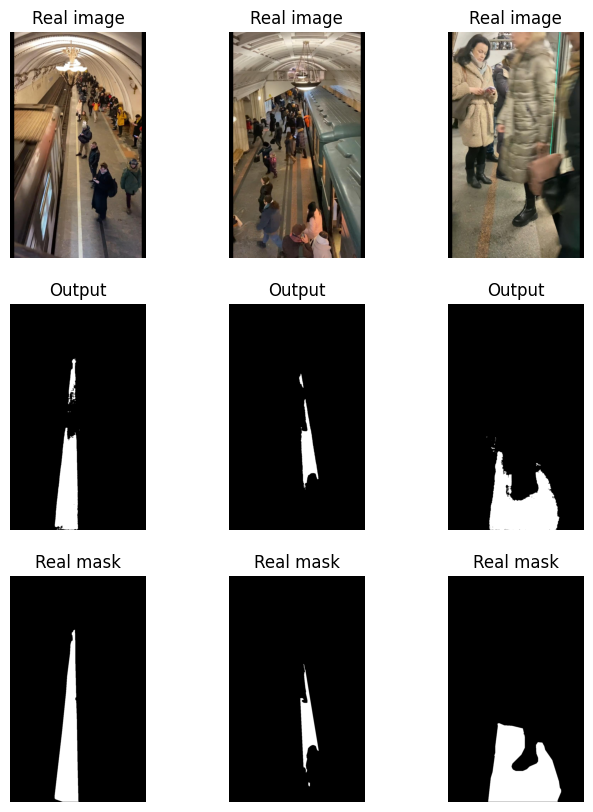

Score on eval time:  30.740406036376953

	Train loss: 0.011042587728729184;
	Val loss: 0.01946630760763599; 
	Val score: 0.9150442734228826;
* Epoch 7/10
Fit epoch time:  934.6130108833313
Eval epoch time:  38.44561457633972


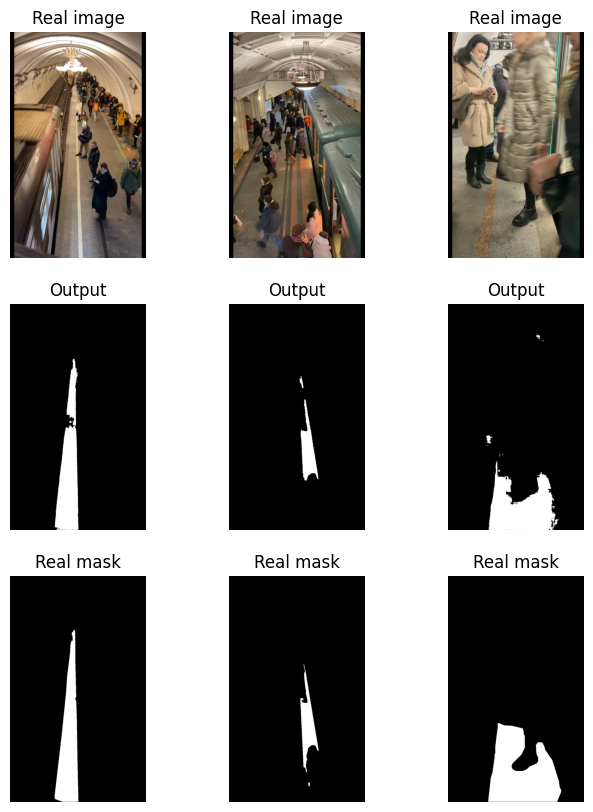

Score on eval time:  30.83236527442932

	Train loss: 0.012281176818878916;
	Val loss: 0.018785124945462542; 
	Val score: 0.9123894071156999;
* Epoch 8/10
Fit epoch time:  936.8930473327637
Eval epoch time:  38.283491134643555


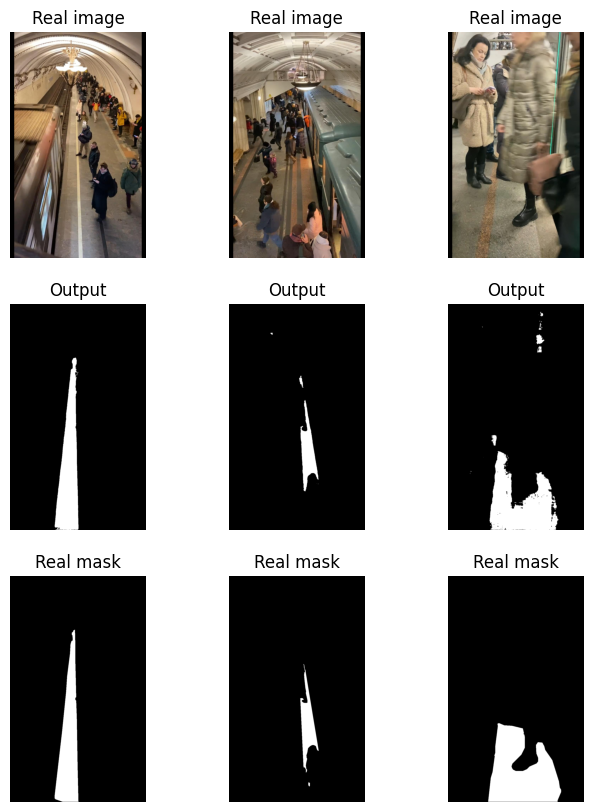

Score on eval time:  30.75296688079834

	Train loss: 0.011121580189944285;
	Val loss: 0.021755508592236884; 
	Val score: 0.903539843791354;
* Epoch 9/10
Fit epoch time:  934.0685131549835
Eval epoch time:  37.68266153335571


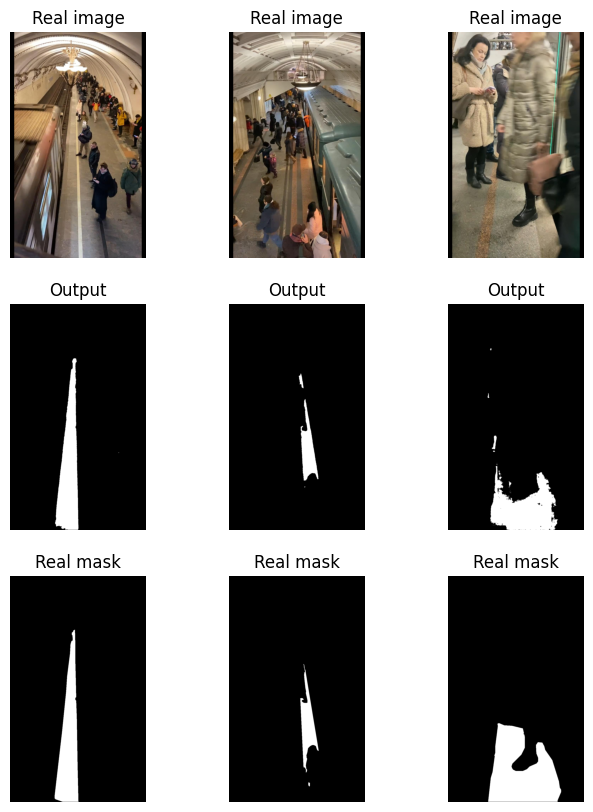

Score on eval time:  30.737372875213623

	Train loss: 0.008806958458001685;
	Val loss: 0.02921384158832705; 
	Val score: 0.9230088691795821;
* Epoch 10/10
Fit epoch time:  937.4831511974335
Eval epoch time:  37.77392077445984


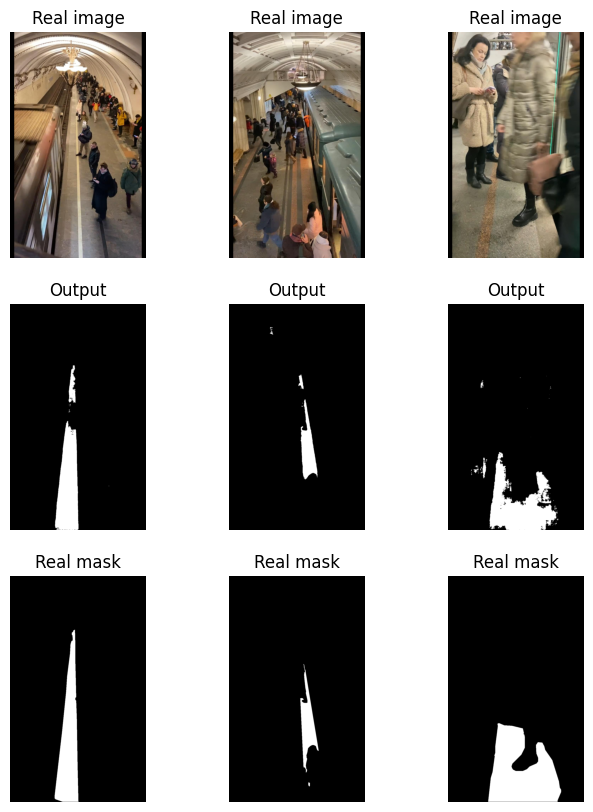

Score on eval time:  30.91264009475708

	Train loss: 0.020051407374914648;
	Val loss: 0.020895638173462544; 
	Val score: 0.8929203848923202;


In [ ]:
loss_hist_3, score_hist_3 = train(segnet_model_bce, optimizer, bce_loss, 10, data_tr, data_val)

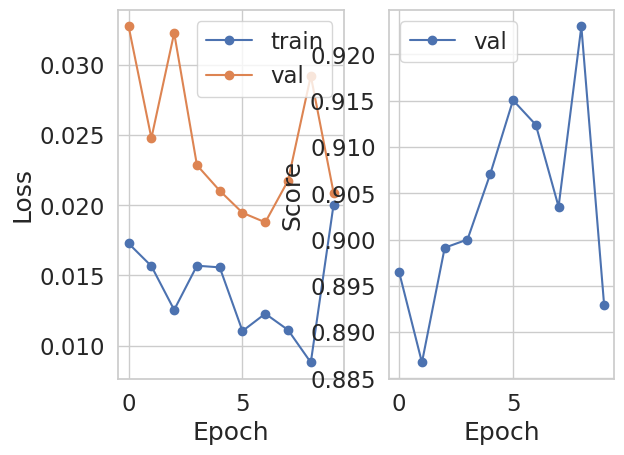

<Figure size 1200x600 with 0 Axes>

In [ ]:
analyze_history(np.array(loss_hist_3), np.array(score_hist_3))

In [ ]:
!cp segnet_bce_1125_10_epoch.pth /content/drive/MyDrive/segnet_bce_1125_30_epoch.pth

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
segnet_model_bce = SegNet().to(device)
segnet_model_bce.load_state_dict(torch.load('/content/drive/MyDrive/segnet_bce_1125_30_epoch.pth'))

<All keys matched successfully>

In [ ]:
print(score_model(segnet_model_bce, iou_pytorch, data_val))

0.8929203848923202


In [ ]:
optimizer = optim.AdamW(segnet_model_bce.parameters(), lr=0.000025)

* Epoch 1/5
Fit epoch time:  933.9835844039917
Eval epoch time:  38.05922794342041


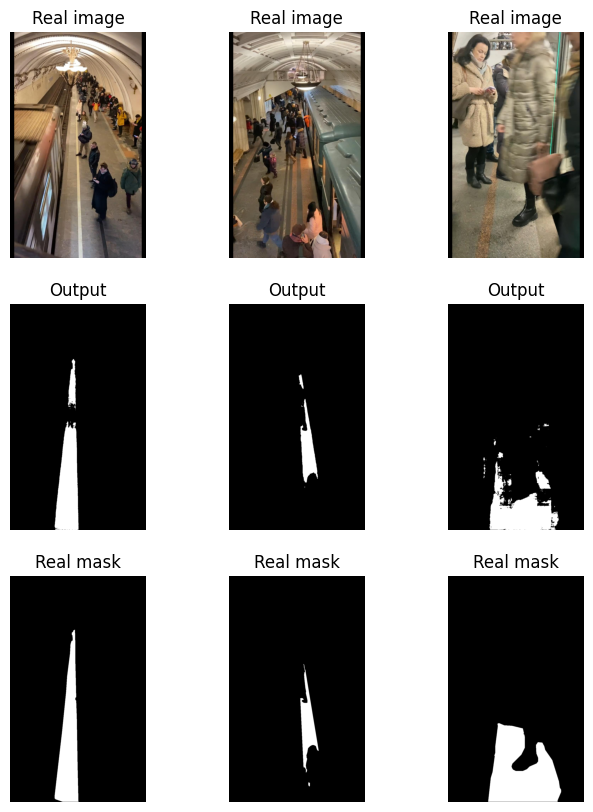

Score on eval time:  30.227455139160156

	Train loss: 0.008043814914553195;
	Val loss: 0.019603549894275128; 
	Val score: 0.9238938225054107;
* Epoch 2/5
Fit epoch time:  930.2812025547028
Eval epoch time:  38.45263481140137


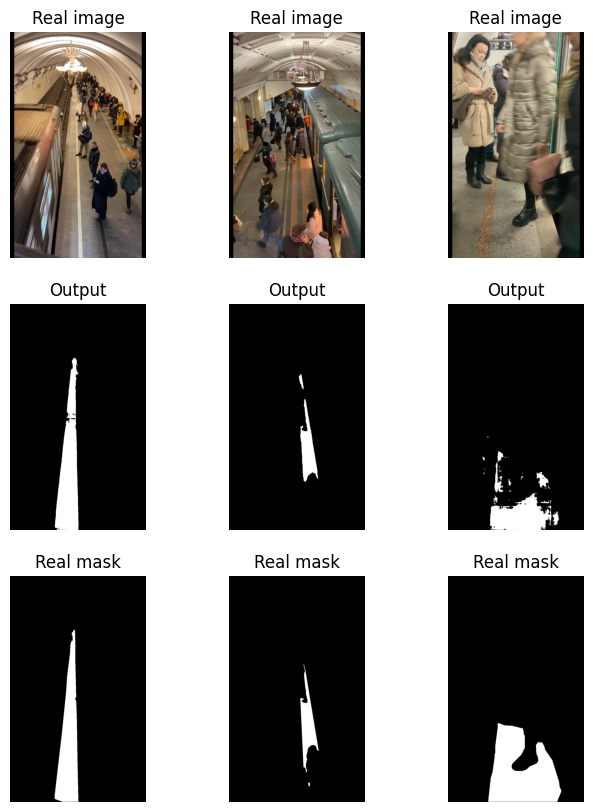

Score on eval time:  30.203711986541748

	Train loss: 0.007247751859833925;
	Val loss: 0.020432752746660097; 
	Val score: 0.9097345265666995;
* Epoch 3/5
Fit epoch time:  930.2994129657745
Eval epoch time:  38.27473068237305


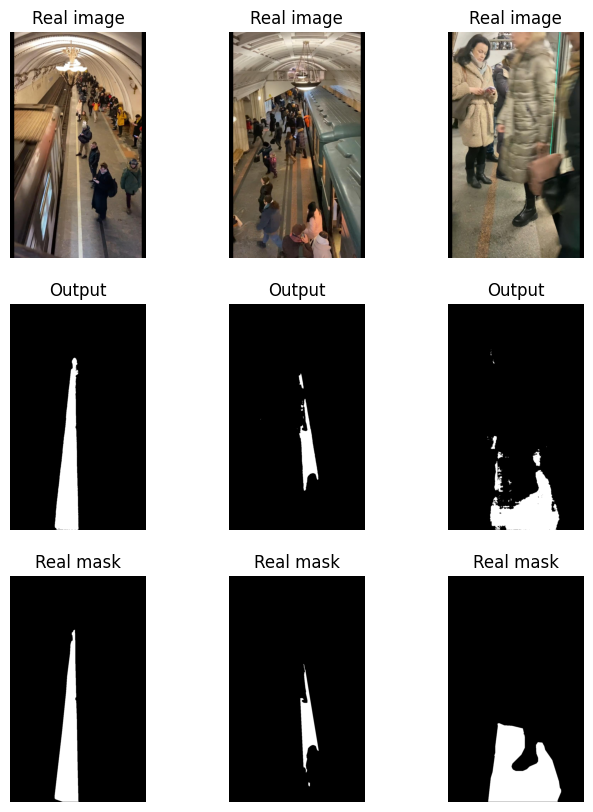

Score on eval time:  30.16518211364746

	Train loss: 0.006713430522830619;
	Val loss: 0.02057496073812378; 
	Val score: 0.9265486888125934;
* Epoch 4/5
Fit epoch time:  930.4715683460236
Eval epoch time:  38.21247148513794


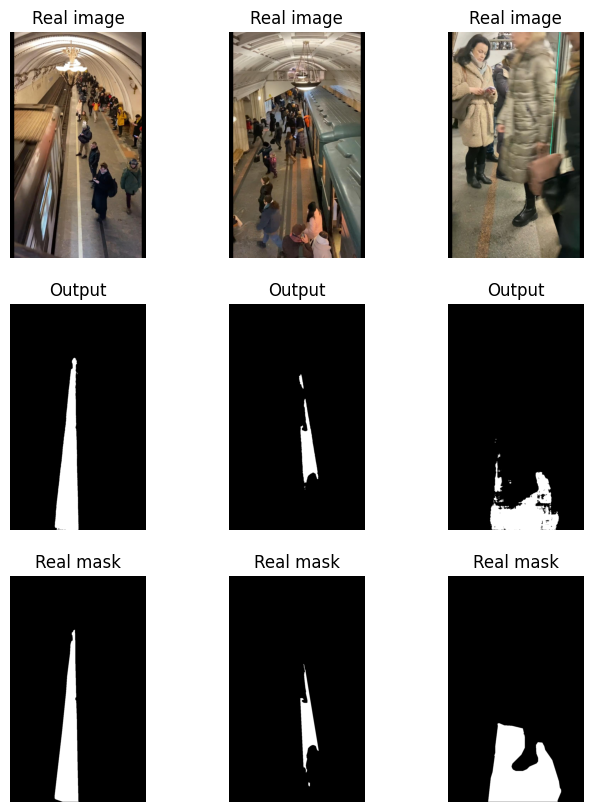

Score on eval time:  30.19911813735962

	Train loss: 0.006273366282178686;
	Val loss: 0.022737781063909026; 
	Val score: 0.9203539997075512;
* Epoch 5/5
Fit epoch time:  928.0406119823456
Eval epoch time:  38.230000019073486


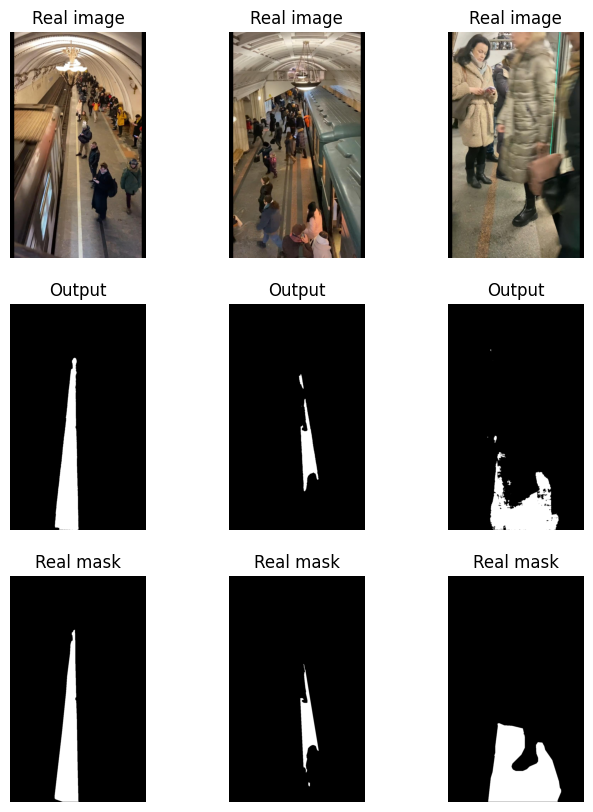

Score on eval time:  30.121805906295776

	Train loss: 0.005873174366095792;
	Val loss: 0.022103557490900292; 
	Val score: 0.9336283296610401;


In [ ]:
loss_hist_4, score_hist_4 = train(segnet_model_bce, optimizer, bce_loss, 5, data_tr, data_val)

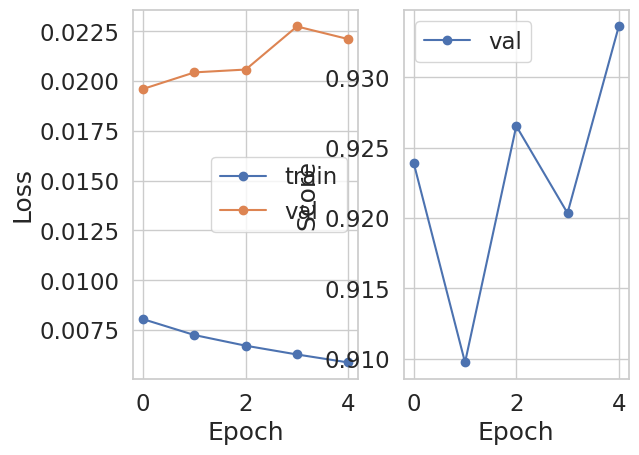

<Figure size 1200x600 with 0 Axes>

In [ ]:
analyze_history(np.array(loss_hist_4), np.array(score_hist_4))

In [ ]:
!cp segnet_bce_1125_5_epoch.pth /content/drive/MyDrive/segnet_bce_1125_35_epoch.pth

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
segnet_model_bce = SegNet().to(device)
segnet_model_bce.load_state_dict(torch.load('/content/drive/MyDrive/segnet_bce_1125_35_epoch.pth'))

<All keys matched successfully>

In [ ]:
print(score_model(segnet_model_bce, iou_pytorch, data_val))

0.9336283296610401


In [ ]:
optimizer = optim.AdamW(segnet_model_bce.parameters(), lr=0.00001)

* Epoch 1/5
Fit epoch time:  996.3301274776459
Eval epoch time:  39.71043395996094


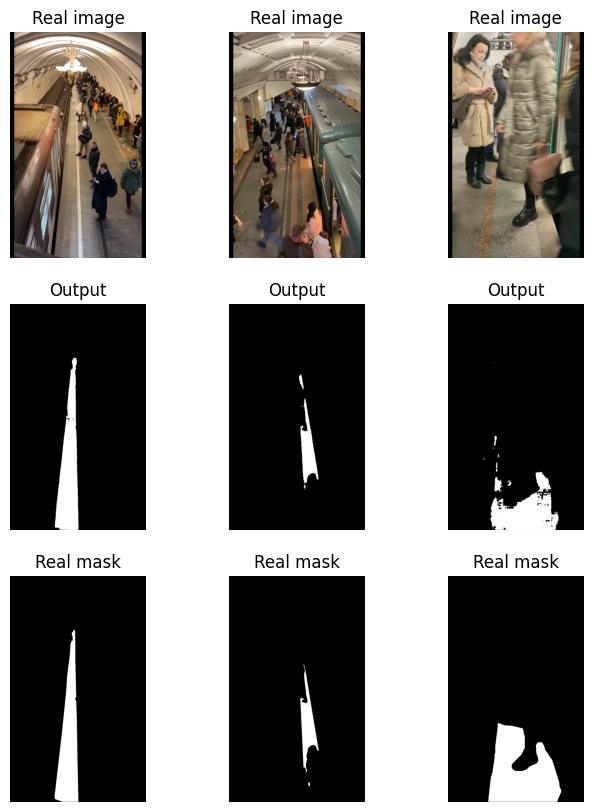

Score on eval time:  32.63012504577637

	Train loss: 0.005437481878767077;
	Val loss: 0.024090715580974267; 
	Val score: 0.9247787774136637;
* Epoch 2/5
Fit epoch time:  999.1307637691498
Eval epoch time:  39.92958998680115


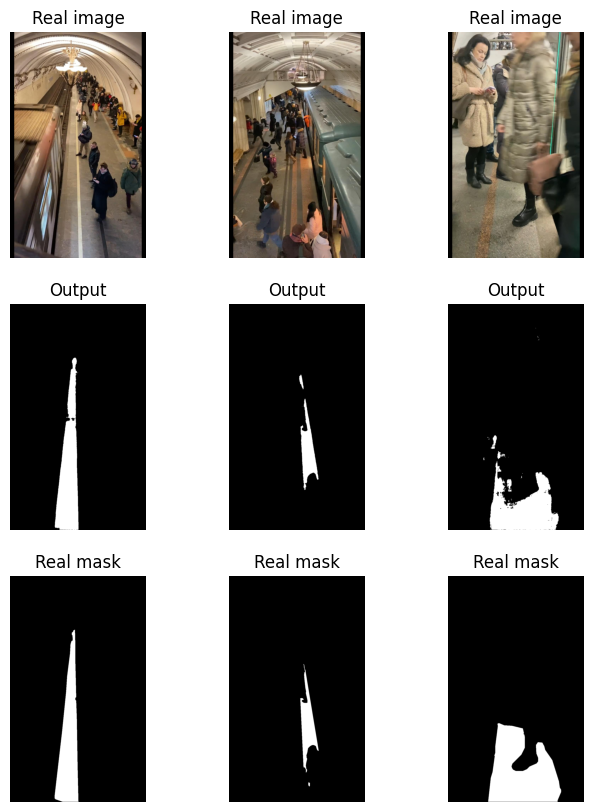

Score on eval time:  32.734755992889404

	Train loss: 0.005257076226964431;
	Val loss: 0.02261670412231995; 
	Val score: 0.9230088660147338;
* Epoch 3/5
Fit epoch time:  998.279237985611
Eval epoch time:  40.09339356422424


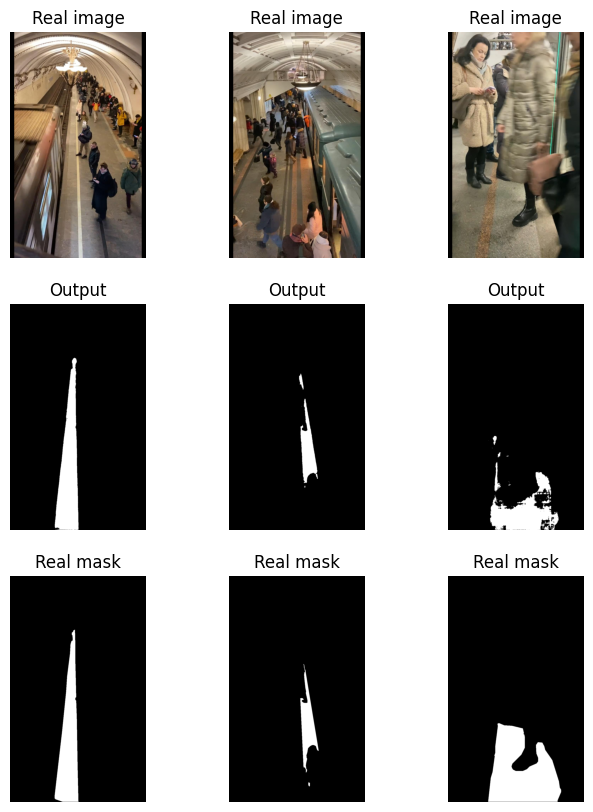

Score on eval time:  32.71532917022705

	Train loss: 0.0053114479650621825;
	Val loss: 0.026562444301140783; 
	Val score: 0.9238938256702592;
* Epoch 4/5
Fit epoch time:  997.4945077896118
Eval epoch time:  39.928467988967896


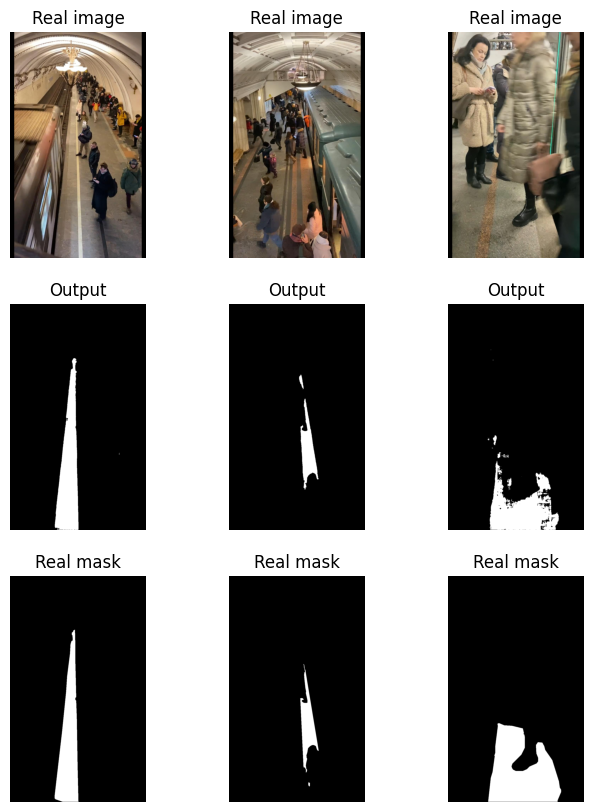

Score on eval time:  32.58038663864136

	Train loss: 0.00540216657514371;
	Val loss: 0.023561425132067066; 
	Val score: 0.9247787742488152;
* Epoch 5/5
Fit epoch time:  997.1553630828857
Eval epoch time:  39.78690767288208


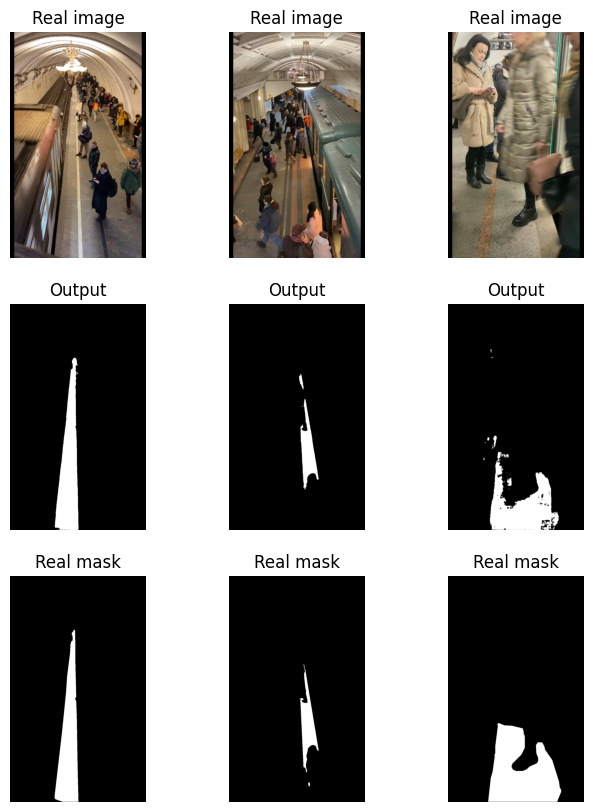

Score on eval time:  32.57183313369751

	Train loss: 0.005200934081923644;
	Val loss: 0.02113222413638656; 
	Val score: 0.9292035535373518;


In [ ]:
loss_hist_5, score_hist_5 = train(segnet_model_bce, optimizer, bce_loss, 5, data_tr, data_val)

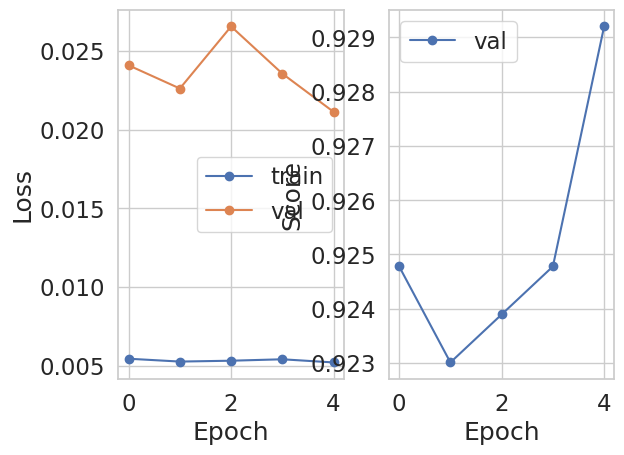

<Figure size 1200x600 with 0 Axes>

In [ ]:
analyze_history(np.array(loss_hist_5), np.array(score_hist_5))

In [ ]:
!cp segnet_bce_1125_5_epoch.pth /content/drive/MyDrive/segnet_bce_1125_40_epoch.pth

In [ ]:
optimizer = optim.AdamW(segnet_model_bce.parameters(), lr=0.000002)

* Epoch 1/5
Fit epoch time:  994.431645154953
Eval epoch time:  39.712599992752075


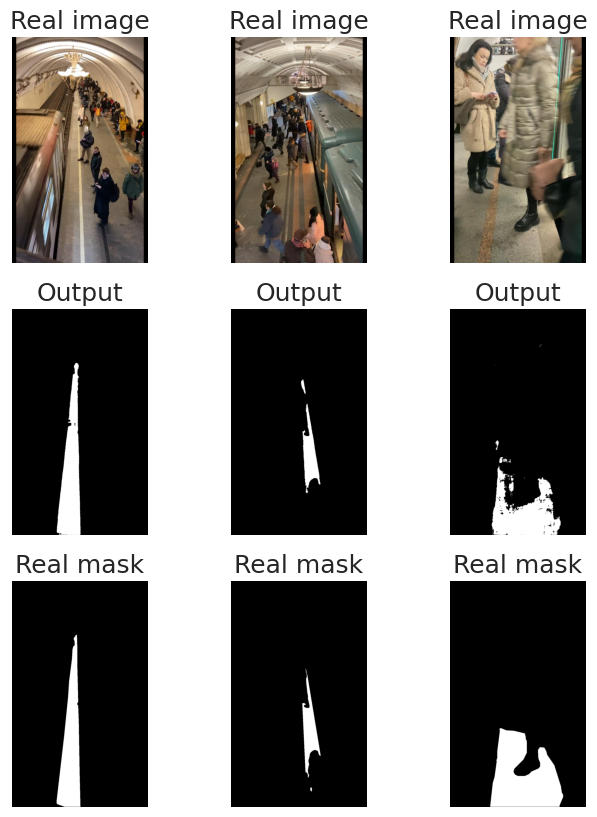

Score on eval time:  32.70012187957764

	Train loss: 0.004949823115067004;
	Val loss: 0.022229730637859456; 
	Val score: 0.9238938193405624;
* Epoch 2/5
Fit epoch time:  992.9628956317902
Eval epoch time:  39.655770778656006


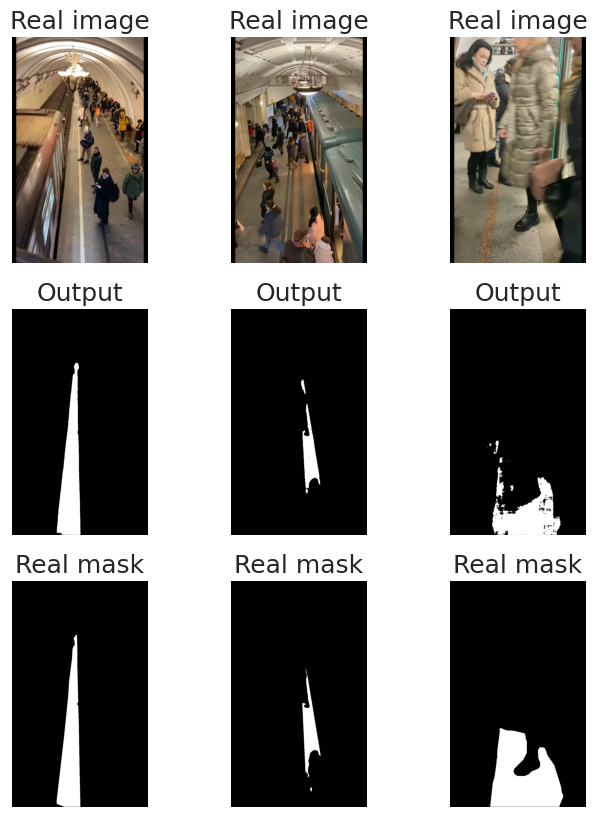

Score on eval time:  32.549822092056274

	Train loss: 0.004866362114992773;
	Val loss: 0.024751097326521324; 
	Val score: 0.9238938177581382;
* Epoch 3/5
Fit epoch time:  993.6227221488953
Eval epoch time:  39.71281337738037


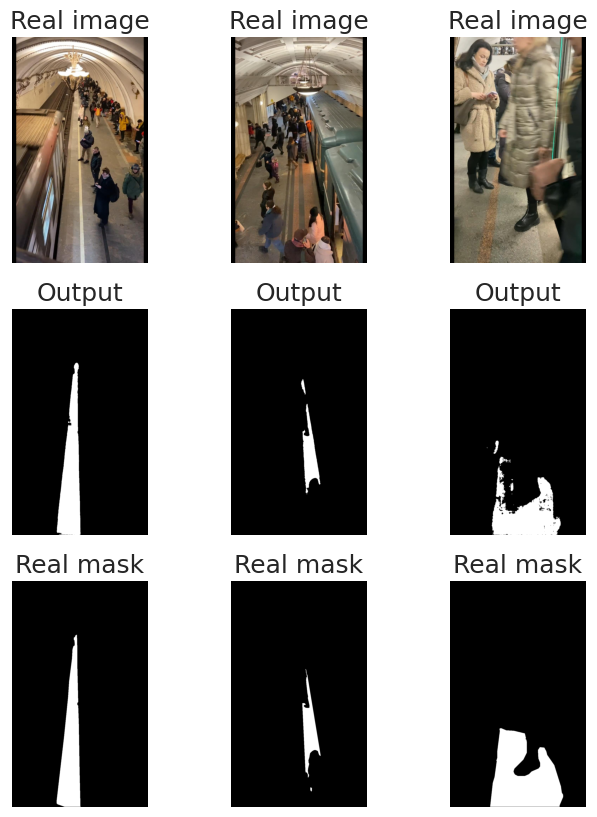

Score on eval time:  32.58820939064026

	Train loss: 0.004855419405121283;
	Val loss: 0.02292616709044813; 
	Val score: 0.9230088628498854;
* Epoch 4/5
Fit epoch time:  993.9670958518982
Eval epoch time:  39.829371213912964


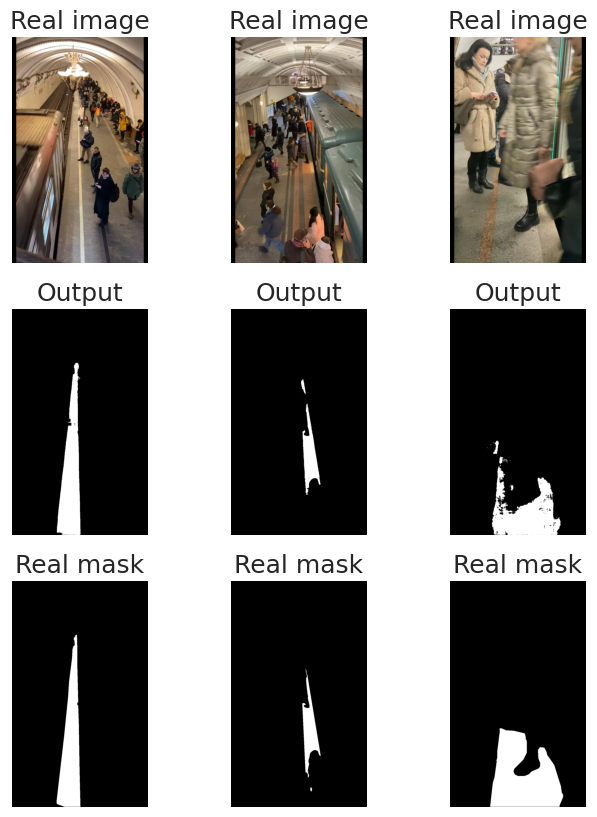

Score on eval time:  32.622458934783936

	Train loss: 0.004837487674715815;
	Val loss: 0.023864814929202595; 
	Val score: 0.9256637339043406;
* Epoch 5/5
Fit epoch time:  992.8982667922974
Eval epoch time:  39.77818751335144


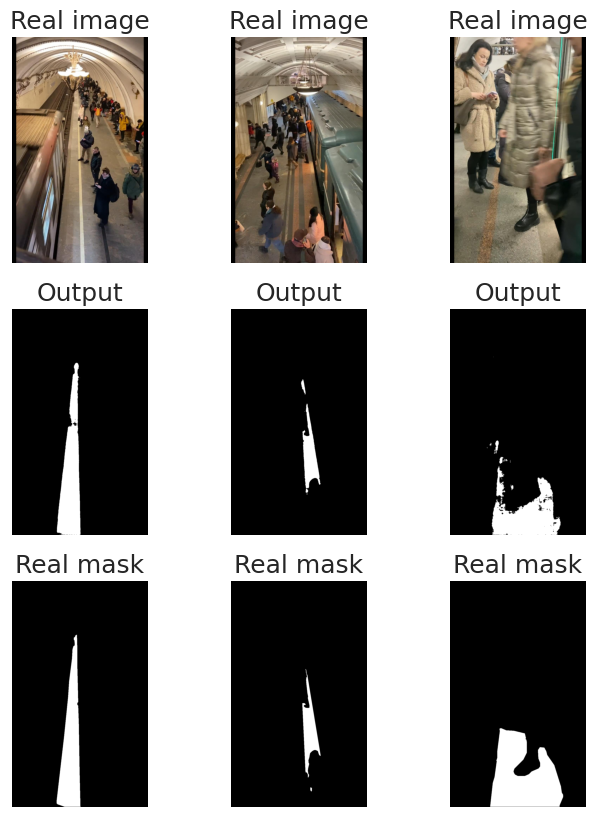

Score on eval time:  32.611085414886475

	Train loss: 0.004734467402590151;
	Val loss: 0.02324943491298936; 
	Val score: 0.9212389514509556;


In [ ]:
loss_hist_6, score_hist_6 = train(segnet_model_bce, optimizer, bce_loss, 5, data_tr, data_val)

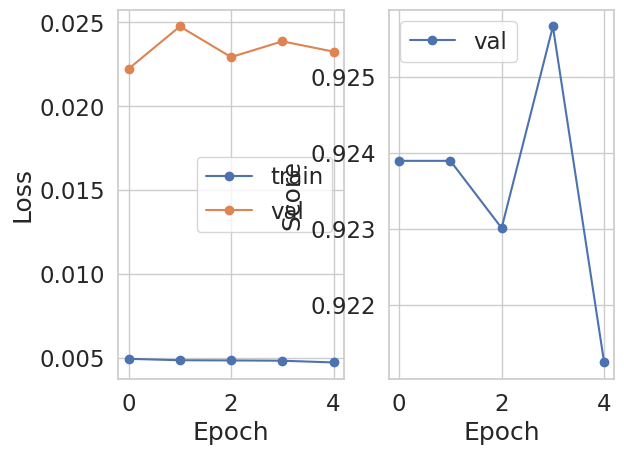

<Figure size 1200x600 with 0 Axes>

In [ ]:
analyze_history(np.array(loss_hist_6), np.array(score_hist_6))

In [ ]:
!cp segnet_bce_1125_10_epoch.pth /content/drive/MyDrive/segnet_bce_1125_45_epoch.pth